<center><h1>Noise Adding, Image Restoration, Sobel Filters</h1></center>

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

In [2]:
def display_images(images, titles):
    plt.figure(figsize=(15, 15))
    num_images = len(images)

    nrows = (num_images + 1) // 2
    ncols = 2
    
    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(nrows, ncols, i)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
samp_img = cv2.imread("coca-cola-logo.png") #Replace with your image path
gray_img = cv2.cvtColor(samp_img, cv2.COLOR_BGR2GRAY).astype(np.float32)

<h1>Adding Different Noise to the Image</h1>

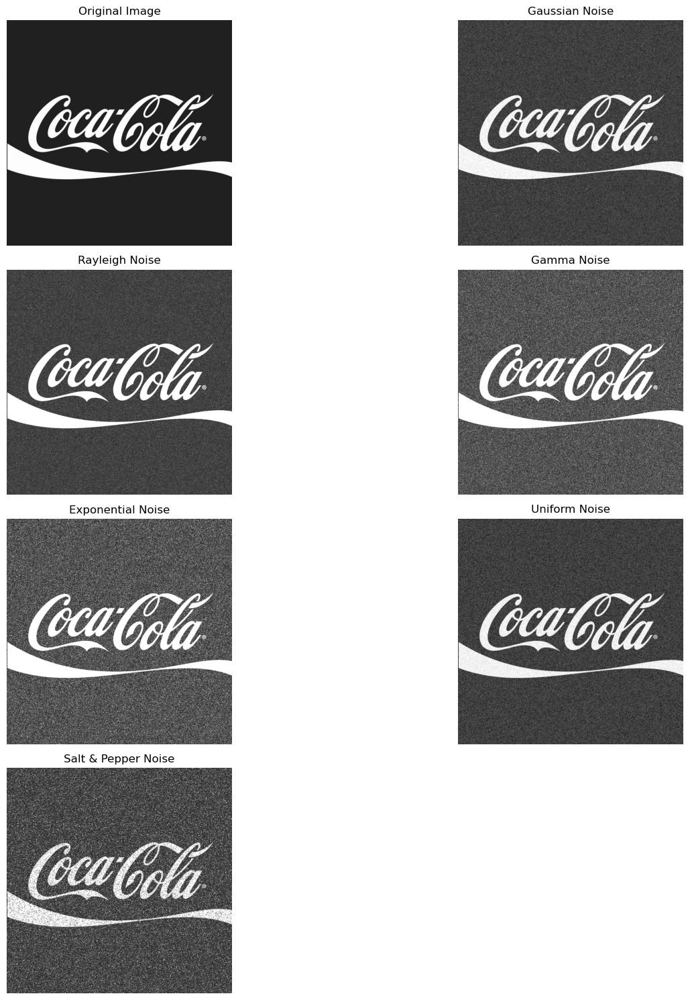

In [4]:
def plot_kde(noise, title):
    kde = gaussian_kde(noise.reshape(-1))
    dist_space = np.linspace(np.min(noise), np.max(noise), 100)
    plt.plot(dist_space, kde(dist_space), label=title)

# Helper function to clip and convert images
def clip_and_convert(img):
    return np.clip(img, 0, 255).astype(np.uint8)

#Gaussian noise
mean = 0
sigma = 25
gaussian_noise = np.random.normal(loc=mean, scale=sigma, size=gray_img.shape)
gaussian_img = clip_and_convert(gray_img + gaussian_noise)

#Rayleigh noise
scale = 30  
rayleigh_noise = np.random.rayleigh(scale, size=gray_img.shape)
rayleigh_img = clip_and_convert(gray_img + rayleigh_noise)

#Gamma noise
shape_param = 2.0  
scale_param = 25.0  
gamma_noise = np.random.gamma(shape=shape_param, scale=scale_param, size=gray_img.shape)
gamma_img = clip_and_convert(gray_img + gamma_noise)

#Exponential noise
scale = 1
lambda_param = 0.02
exponential_noise = np.random.exponential(scale / lambda_param, size=gray_img.shape)
exponential_img = clip_and_convert(gray_img + exponential_noise)

#Uniform noise
low = -50
high = 50
uniform_noise = np.random.uniform(low=low, high=high, size=gray_img.shape)
uniform_img = clip_and_convert(gray_img + uniform_noise)

#Salt & Pepper noise function
def salt_and_pepper_noise(img, salt_prob=0.1, pepper_prob=0.1):
    noise_img = img.copy()
    total_pixel = img.size

    num_salt = int(total_pixel * salt_prob)
    salt_coords = tuple(np.random.randint(0, i, num_salt) for i in img.shape)
    noise_img[salt_coords] = 255

    num_pepper = int(total_pixel * pepper_prob)
    pepper_coords = tuple(np.random.randint(0, i, num_pepper) for i in img.shape)
    noise_img[pepper_coords] = 0

    return noise_img

sp_img = salt_and_pepper_noise(gray_img)

# Image titles
images = [gray_img, gaussian_img, rayleigh_img, gamma_img, exponential_img, uniform_img, sp_img]
titles = ["Original Image", "Gaussian Noise", "Rayleigh Noise", "Gamma Noise",
          "Exponential Noise", "Uniform Noise", "Salt & Pepper Noise"]

display_images(images, titles)

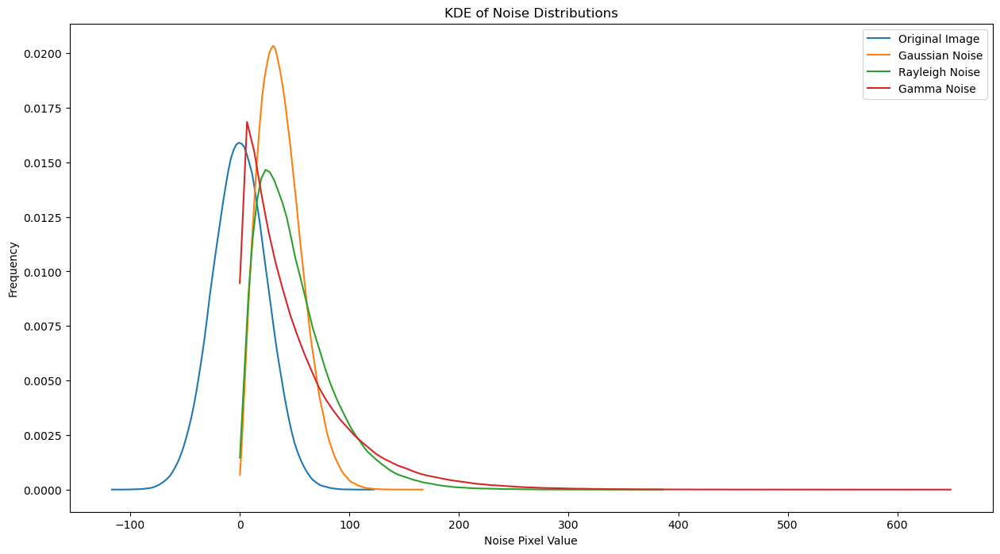

In [5]:
noise_types = [gaussian_noise,rayleigh_noise,gamma_noise,exponential_noise]
title = ["Gaussian Noise","Rayleigh Noise","Gamma Noise","Exponential Noise"]

plt.figure(figsize=(15,8))

for noise, title in zip(noise_types, titles):
    plot_kde(noise, title)

plt.xlabel("Noise Pixel Value")
plt.ylabel("Frequency")
plt.title("KDE of Noise Distributions")
plt.legend()
plt.show()

<h1>Image Restoration</h1>
<h1>Mean filters</h1>

In [6]:
def arith_mean_filter(image, kernel_size=3):
    pad = kernel_size // 2
    padded_img = np.pad(image, pad, mode='constant', constant_values=0)
    filtered_img = np.zeros_like(image, dtype=np.float32)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_img[i:i+kernel_size, j:j+kernel_size]
            filtered_img[i, j] = np.mean(region)

    return filtered_img.astype(np.uint8)

def geometric_mean_filter(image, kernel_size):
    pad = kernel_size // 2
    padded_img = np.pad(image, pad, mode='constant', constant_values=1)
    filtered_img = np.zeros_like(image, dtype=np.float32)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_img[i:i+kernel_size, j:j+kernel_size] + 1e-5  
            filtered_img[i, j] = np.exp(np.mean(np.log(region)))  

    filtered_img = (filtered_img / np.max(filtered_img)) * 255
    return filtered_img.astype(np.uint8)

def harmonic_mean_filter(image, kernel_size):
    h, w = image.shape
    pad = kernel_size // 2
    filtered_image = np.zeros_like(image, dtype=np.float32)

    padded_image = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REPLICATE)

    for i in range(h):
        for j in range(w):
            neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size]
            if np.any(neighborhood == 0):
                filtered_image[i, j] = image[i, j]
            else:
                filtered_image[i, j] = (kernel_size * kernel_size) / np.sum(1.0 / (neighborhood + 1e-8))

    return np.uint8(filtered_image)

def contraharmonic_mean_filter(image, kernel_size, Q):
    h, w = image.shape
    pad = kernel_size // 2
    filtered_image = np.zeros_like(image, dtype=np.float32)
    
    padded_image = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REPLICATE)

    for i in range(h):
        for j in range(w):
            neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size].astype(np.float32)
            num = np.sum(neighborhood ** (Q + 1))
            den = np.sum(neighborhood ** Q) + 1e-8
            filtered_image[i, j] = num / den

    return np.uint8(np.clip(filtered_image, 0, 255))
    
filtered_img = arith_mean_filter(gaussian_img, kernel_size=3)
geometric_img = geometric_mean_filter(gaussian_img, 5)
harmonic_img = harmonic_mean_filter(sp_img, 3)
contra_harmonic_img = contraharmonic_mean_filter(sp_img, 3,Q=0)

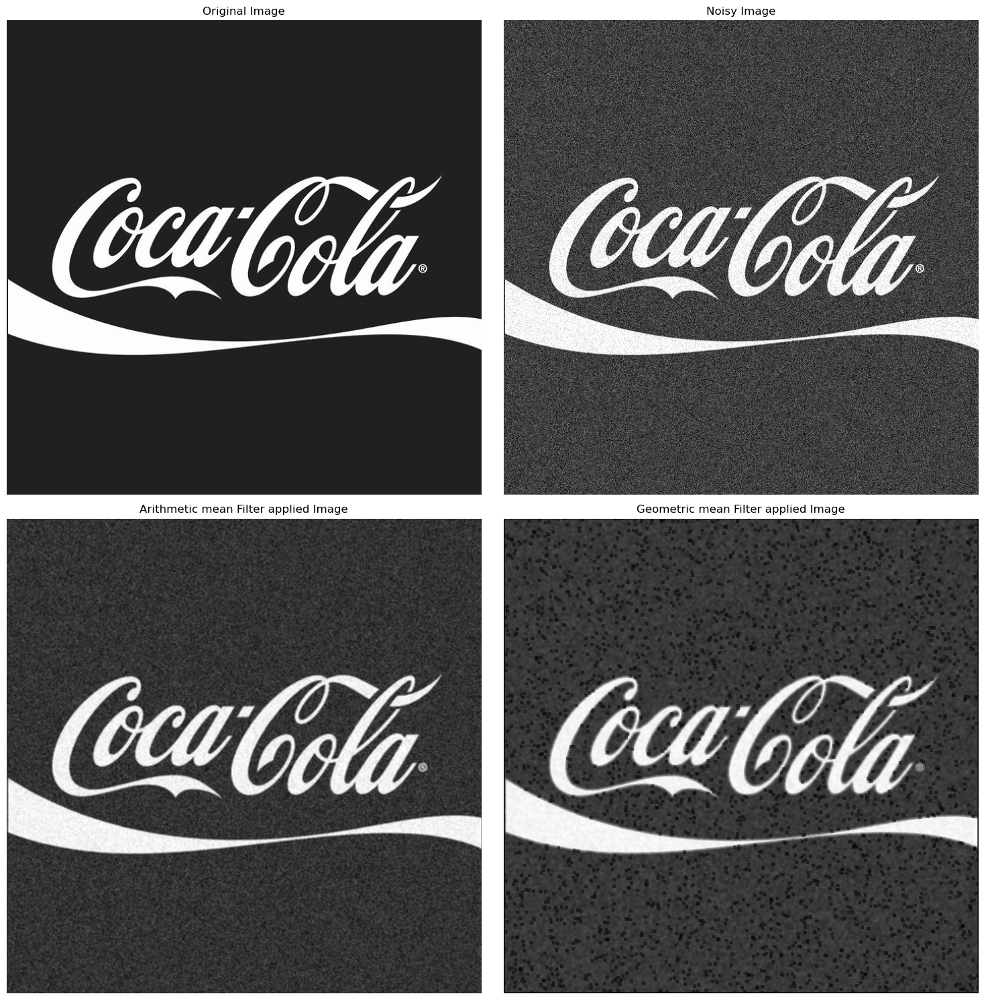

In [7]:
images = [gray_img,gaussian_img,filtered_img,geometric_img]
titles = ["Original Image","Noisy Image","Arithmetic mean Filter applied Image",
          "Geometric mean Filter applied Image"]

display_images(images, titles)

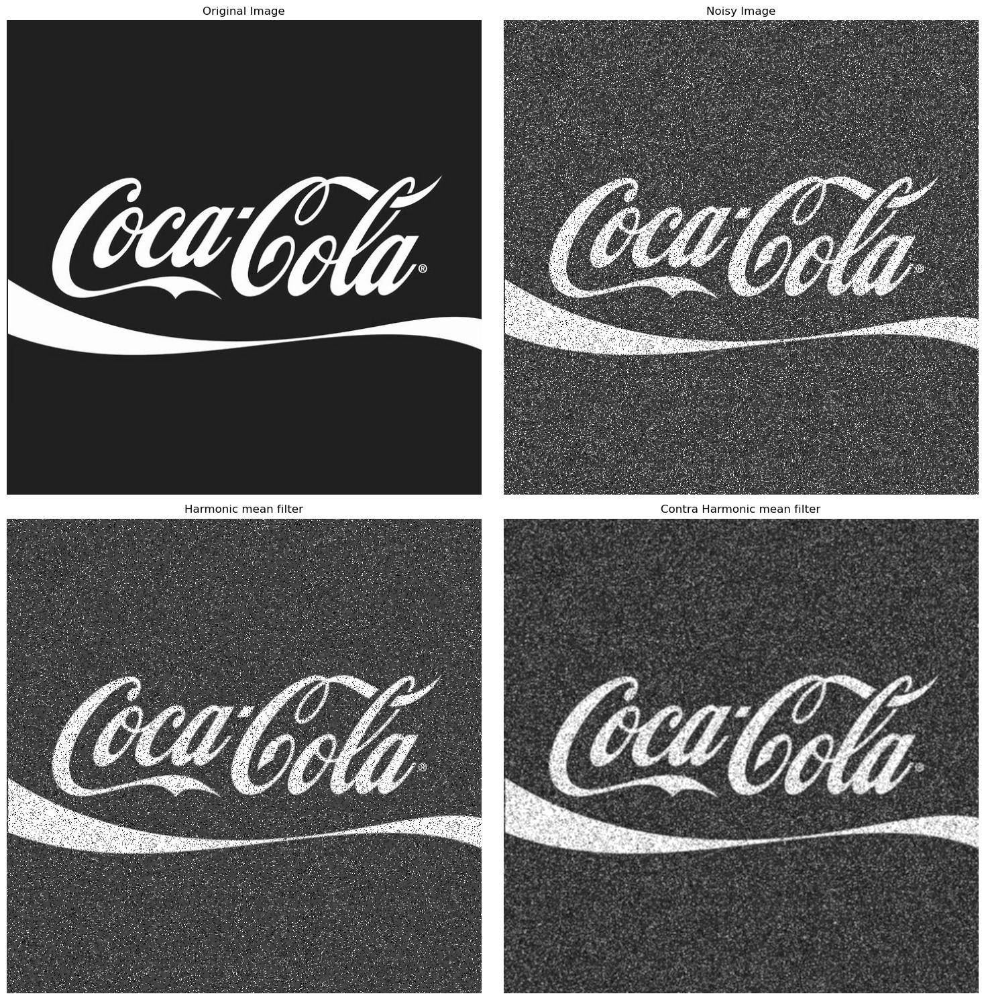

In [8]:
images = [gray_img,sp_img,harmonic_img,contra_harmonic_img]
titles = ["Original Image","Noisy Image",
          "Harmonic mean filter","Contra Harmonic mean filter"]

display_images(images, titles)

<h1>Order Statistical filters</h1>

In [9]:
def apply_filter(image, kernel_size, filter_type, d=0):
    h, w = image.shape
    pad = kernel_size // 2
    filtered_image = np.zeros_like(image, dtype=np.float32)
    padded_image = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REPLICATE)

    for i in range(h):
        for j in range(w):
            neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size].flatten()

            if filter_type == "median":
                filtered_image[i, j] = np.median(neighborhood)
            elif filter_type == "min":
                filtered_image[i, j] = np.min(neighborhood)
            elif filter_type == "max":
                filtered_image[i, j] = np.max(neighborhood)
            elif filter_type == "midpoint":
                min_val = float(np.min(neighborhood))
                max_val = float(np.max(neighborhood))  
                filtered_image[i, j] = (min_val + max_val) / 2
            elif filter_type == "alpha_trimmed":
                sorted_vals = np.sort(neighborhood)
                trimmed_vals = sorted_vals[d: -d] if d > 0 else sorted_vals
                filtered_image[i, j] = np.mean(trimmed_vals)

    return np.uint8(np.clip(filtered_image, 0, 255))

kernel_size = 3
filtered_median = apply_filter(sp_img, kernel_size, "median")
filtered_min = apply_filter(sp_img, kernel_size, "min")
filtered_max = apply_filter(sp_img, kernel_size, "max")
filtered_midpoint = apply_filter(sp_img, kernel_size, "midpoint")
filtered_alpha_trimmed = apply_filter(sp_img, kernel_size, "alpha_trimmed", d=2)

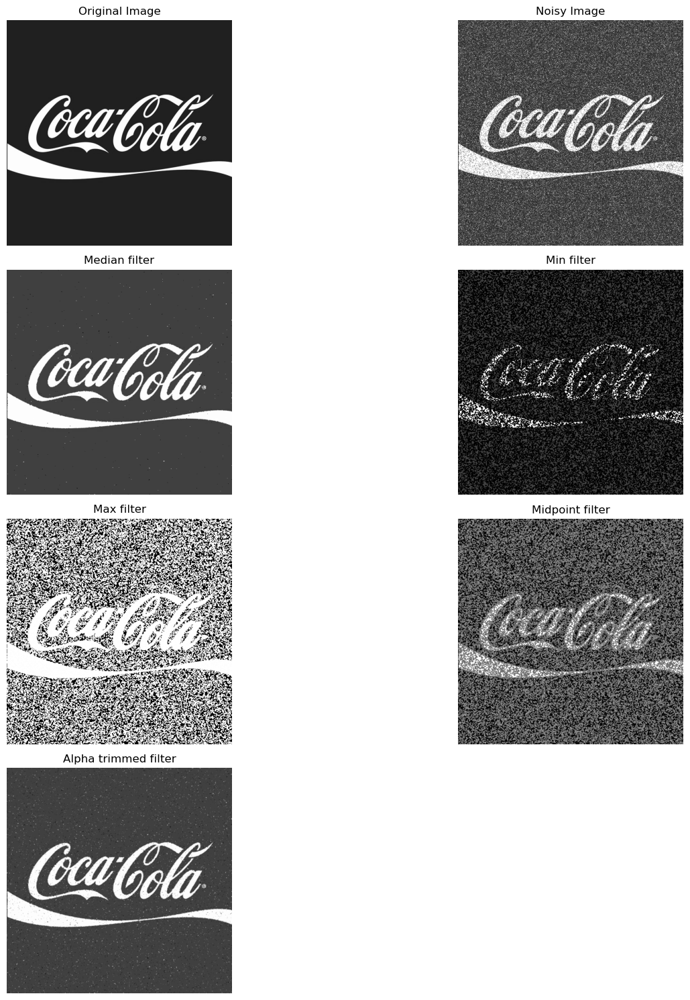

In [10]:
images = [gray_img,sp_img,filtered_median,filtered_min,filtered_max,filtered_midpoint,filtered_alpha_trimmed]
titles = ["Original Image","Noisy Image",
          "Median filter","Min filter","Max filter","Midpoint filter","Alpha trimmed filter"]

display_images(images, titles)

<h1>Adpative Filter</h1>

In [11]:
def adaptive_median_filter(image, max_kernel_size=7):
    h, w = image.shape
    output = np.copy(image)

    for i in range(h):
        for j in range(w):
            kernel_size = 3
            while kernel_size <= max_kernel_size:
                pad = kernel_size // 2
                i_min, i_max = max(0, i - pad), min(h, i + pad + 1)
                j_min, j_max = max(0, j - pad), min(w, j + pad + 1)

                neighborhood = image[i_min:i_max, j_min:j_max].flatten()
                min_val, med_val, max_val = np.min(neighborhood), np.median(neighborhood), np.max(neighborhood)

                if min_val < med_val < max_val:
                    output[i, j] = med_val if image[i, j] == min_val or image[i, j] == max_val else image[i, j]
                    break
                else:
                    kernel_size += 2

    return output

def adaptive_mean_filter(image, kernel_size=5):
    h, w = image.shape
    pad = kernel_size // 2
    filtered_image = np.zeros_like(image, dtype=np.float32)
    padded_image = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REPLICATE)

    global_variance = np.var(image)

    for i in range(h):
        for j in range(w):
            neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size]
            local_mean = np.mean(neighborhood)
            local_variance = np.var(neighborhood)

            if local_variance > 0:
                filtered_image[i, j] = image[i, j] - (global_variance / local_variance) * (image[i, j] - local_mean)
            else:
                filtered_image[i, j] = local_mean

    return np.uint8(np.clip(filtered_image, 0, 255))
    
filtered_adaptive_median = adaptive_median_filter(sp_img, max_kernel_size=7)
filtered_adaptive_mean = adaptive_mean_filter(sp_img, kernel_size=5)

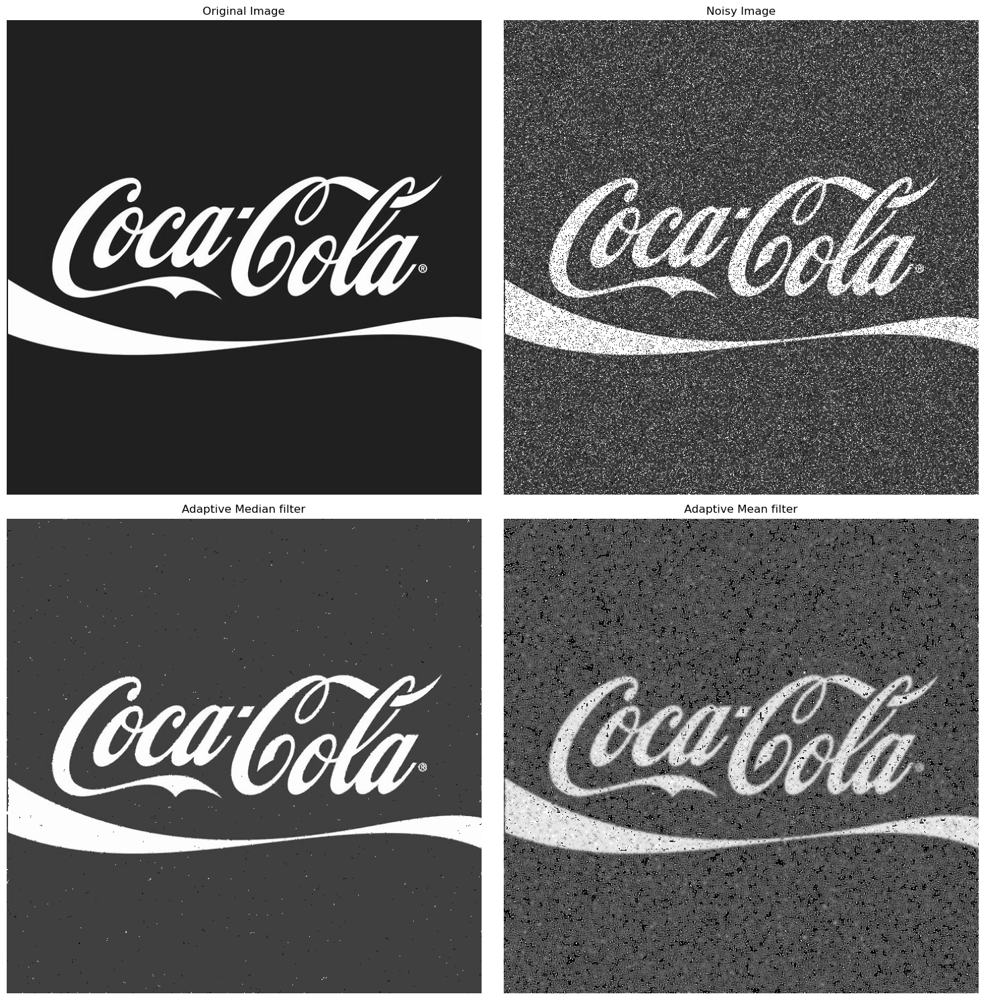

In [12]:
images = [gray_img,sp_img,filtered_adaptive_median,filtered_adaptive_mean]
titles = ["Original Image","Noisy Image",
          "Adaptive Median filter","Adaptive Mean filter"]

display_images(images, titles)

<h1>Sobel Filter</h1>

In [45]:
def sobel_filter(image,kernel,size):
    image = image.astype(np.float32)
    height, width = image.shape[:2]

    sobel_kernel1 = np.array([[0, 1],
                             [-1, 0]])

    sobel_kernel2 = np.array([[-1, 0, 1], 
                            [-2, 0, 2], 
                            [-1, 0, 1]])
    
    sobel_kernel3 = np.array([[1, 2, 3, 2, 1], 
                             [2, 3, 5, 3, 2], 
                             [0, 0, 0, 0, 0],
                             [-2, -3, -5, -3, -2],
                             [-1, -2, -3, -2, -1]])

    if size=='big':
        sobel_kernel = sobel_kernel3

    elif size=='medium':
        sobel_kernel = sobel_kernel2

    else:
        sobel_kernel = sobel_kernel1
    
    padding = sobel_kernel.shape[0] // 2
    padded_img = np.pad(image, ((padding, padding),(padding, padding)), mode = 'constant', constant_values=0)

    sobel_img = np.zeros_like(image)

    for i in range(padding, width + padding):
        for j in range(padding, height + padding):
            region = padded_img[j - padding:j + padding + 1, i - padding:i + padding + 1]
            if region.shape == sobel_kernel.shape:
                sobel_img[j - padding, i - padding] = np.sum(region * sobel_kernel)

    return np.clip(sobel_img, 0, 255).astype(np.uint8)

In [48]:
sobel_kernel_1 = sobel_filter(gray_img,None,'big')
sobel_kernel_2 = sobel_filter(gray_img,None,'medium')
sobel_kernel_3 = sobel_filter(gray_img,None,'small')

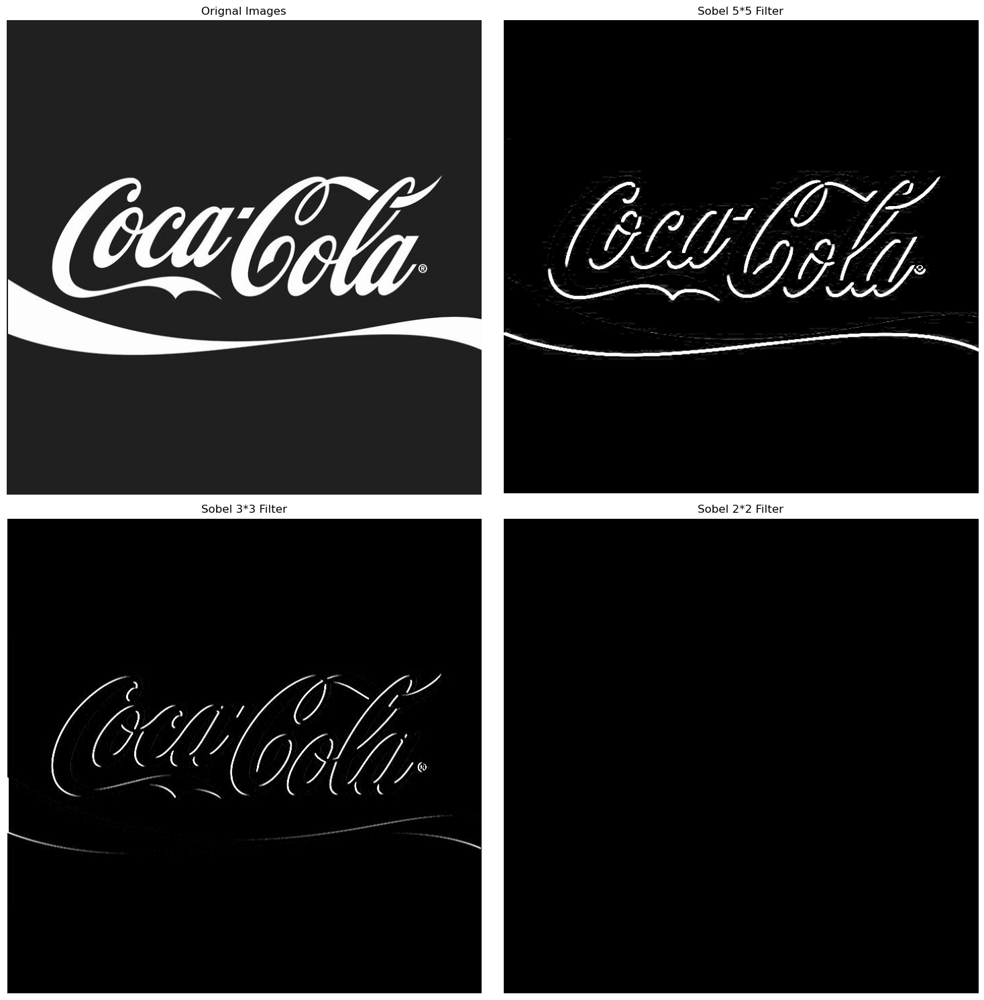

In [49]:
images = [gray_img,sobel_kernel_1,sobel_kernel_2,sobel_kernel_3]
titles = ["Orignal Images","Sobel 5*5 Filter","Sobel 3*3 Filter","Sobel 2*2 Filter"]

display_images(images,titles)